# GTEx + AHBA Samples Pipeline — Tensors + On-Brain

Single figure-builder for the *Datasets and pipeline* slide
(`context_packages/schematics/tensor_slide.png`). Renders the four pipeline tensors plus
their on-brain complements, reusing the shipped tensor renderers
(`src/eval_utils/eval_samples.py`) and the surface renderer (`src/eval_utils/eval_onbrain.py`).

**Layout**
1. Tensor 1 — standalone **GTEx** (raw, native tissue axis)
2. Tensor 2 — standalone **AHBA** (region-matched superset)
3. Tensor 3 — **joint** ComBat-harmonized GTEx+AHBA
4. Tensor 4 — **joint** GTEx `loro_fused` (predictions + extrapolations) vs AHBA ref
5. On-brain — **AHBA** donors (1×6, left-sagittal, gene index 0)
6. On-brain — **GTEx** subjects (3×6, sampling-coverage diversity)

Each section has its own config block for on-the-fly tweaks. Heavy state (PREPOST / matching
context) loads once near the top; runs cleanly back-to-front.

In [12]:
%load_ext autoreload
%autoreload 2

import random as _random
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

from src.eval_utils.eval_style import set_academic_style
from src.eval_utils.eda_core import prepare_pre_post_harmonization_cached
from src.eval_utils.results_eda import EDAConfig
from src.eval_utils.eval_samples import (
    MatchingContext,
    build_native_tensor_view,
    build_combat_tensor_view,
    build_prediction_tensor_view,
    build_joint_tensor_view,
    plot_gtex_tensor_voxels,
    plot_joint_tensor_voxels,
)
from src.eval_utils import eval_onbrain as ob

set_academic_style()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 0 · Shared config & one-time load

Global knobs shared by every section. `BIG_FONTS` is the **targeted** large-text override
(title + colorbar + axis titles bumped; tick density untouched). `BASE` collects the voxel
render knobs common to all four tensors; each section spreads `BASE` and overrides the few
keys that differ.

In [13]:
CSV_PATH   = 'data/raw/gxp_samples.csv'
GENE_LIST  = 'richiardi2015'      # ~100-gene panel; gene[0] is the tensor-face / on-brain gene
N_GENES    = 100
GENE_TICK_STEP = 5                # tick every 5 genes — default for ALL tensors

# Matching / harmonization policy (shared across tensors 3-4 + on-brain)
MATCHING_POLICY            = 'centroids_and_volumes'
MATCHING_POLICY_HEMI_MODE  = 'force_left'
GTEX_REP_MODE              = 'centroid'
GTEX_HEMI_MODE             = 'mirror_left'
COLLAPSE_CEREBELLUM        = False
MIN_OBSERVED_PARCELS       = 5
COMBAT_USE_COVARIATES      = True
RANDOM_SEED                = 42

CACHE_ROOT = 'out/loro_subject_cache_cv'   # centroids_and_volumes cache
MODEL_NAME = 'dlam'
GENE_SCOPE = 'allgenes'

BOX_ZOOM = 1.0          # tensor zoom; lower if voxels get cut off ('auto' ~1.45 over-zooms)

# Much-larger title + colorbar + axis titles for the individual tensor plots.
BIG_FONTS = {'title': 'xxl', 'xlabel': 'xl', 'ylabel': 'xl', 'zlabel': 'xl',
             'cbar_label': 'xl', 'xtick': 'm', 'ytick': 'm', 'ztick': 'm'}

# Voxel render knobs common to every tensor (valid for BOTH renderers).
BASE = dict(
    missing_rgba=(0.78, 0.78, 0.78, 1.0),
    future_imputation_rgba=(0.78, 0.78, 0.78, 0.3),
    figsize='auto', dpi=300, axes_bbox='auto', colorbar_bbox='auto',
    box_aspect='compressed_data', box_zoom=BOX_ZOOM, title_pad=2.0,
    axis_assignment=('gene', 'region', 'subject'), elev=20.0, azim=24.0,
    gene_tick_step=GENE_TICK_STEP, tick_label_pad=0.0,
    subject_label_mode='full', gene_label_mode='full',
    show_x_axis_label=True, show_axis_labels=False,
    show_gene_ticklabels=False, show_region_label_colors=False,
    show_axis_lines=True, show_tick_lines=True, show_grid=False, show_legend=False,
    mask_render_mode='two_pass', font_sizes=BIG_FONTS,
)

In [14]:
# One-time PREPOST + matching context (cached; reused by tensors 3-4 and both on-brain panels).
cfg = EDAConfig(
    csv_path=CSV_PATH, cache_root=CACHE_ROOT, gene_scope=GENE_SCOPE,
    min_observed_parcels=MIN_OBSERVED_PARCELS, combat_use_covariates=COMBAT_USE_COVARIATES,
    gtex_rep_mode=GTEX_REP_MODE, gtex_hemi_mode=GTEX_HEMI_MODE,
    matching_policy=MATCHING_POLICY, matching_policy_hemi_mode=MATCHING_POLICY_HEMI_MODE,
    collapse_cerebellum=COLLAPSE_CEREBELLUM,
)
prepost = prepare_pre_post_harmonization_cached(cfg)
ctx = MatchingContext.from_cfg(cfg, prepost)
print(f'parcels={len(ctx.regions_full)}  genes={len(ctx.genes_full)}  '
      f'gtex_subjects={len(prepost["subjects"])}  ahba_subjects={prepost["ahba_raw"]["subject"].astype(str).nunique()}')

[prepost_cache] hit  notebooks/cache/prepost/0f8616c23cf88e0f.pkl  (8961.2 MB)
parcels=150  genes=11704  gtex_subjects=318  ahba_subjects=6


## Tensor 1 — standalone GTEx (raw, native)

Native GTEx tissue axis (`region_matched`), 75 subjects. Subject labels every 5; **native**
region labels every 1; gene x-axis title on; gene ticks every 5 (no per-gene labels).

/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_samples.py:868: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


GTEx T1 (75, 12, 97) axis= gtex_tissue gene[0]= ADAM23


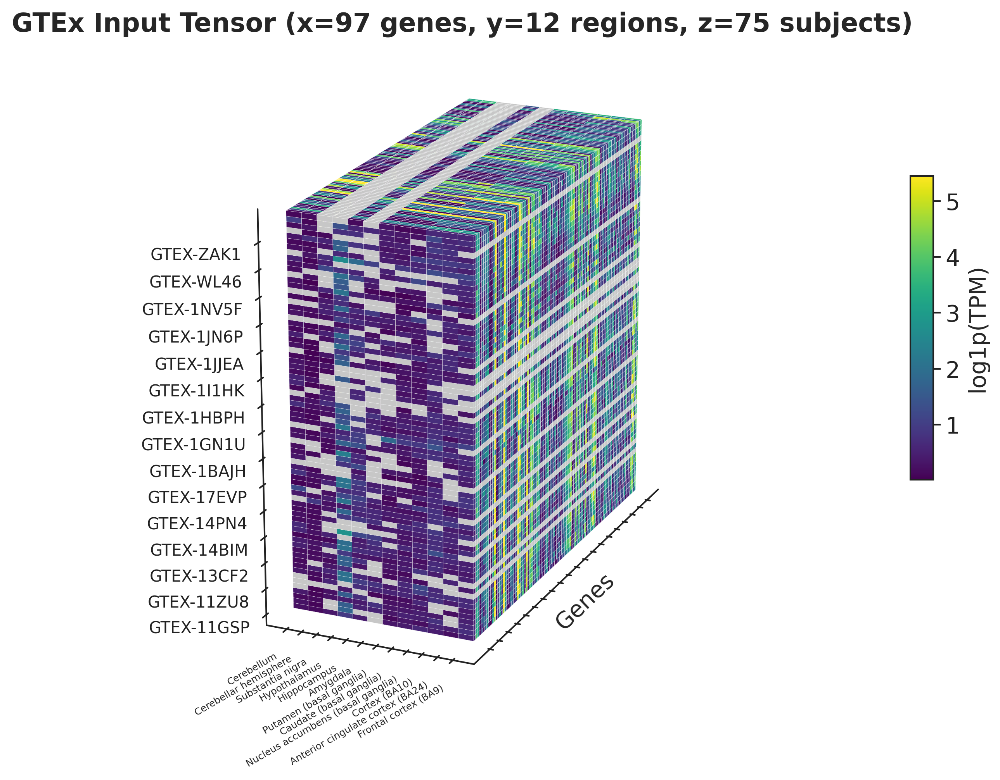

In [4]:
T1_N_SUBJECTS        = 75
T1_SUBJECT_TICK_STEP = 5
T1_REGION_TICK_STEP  = 1

gtex_t1 = build_native_tensor_view(
    CSV_PATH, dataset='GTEx', region_ordering='region_matched',
    n_subjects=T1_N_SUBJECTS, gene_panel=GENE_LIST, n_genes=N_GENES,
    min_regions_per_subject=MIN_OBSERVED_PARCELS, random_seed=RANDOM_SEED,
    matching_policy=MATCHING_POLICY, matching_policy_hemi_mode=MATCHING_POLICY_HEMI_MODE,
    gtex_rep_mode=GTEX_REP_MODE, gtex_hemi_mode=GTEX_HEMI_MODE,
)
print('GTEx T1', gtex_t1.values.shape, 'axis=', gtex_t1.region_axis_kind, 'gene[0]=', gtex_t1.genes[0])

fig, ax = plot_gtex_tensor_voxels(
    gtex_t1, **{**BASE,
        'subject_tick_step': T1_SUBJECT_TICK_STEP,
        'region_tick_step': T1_REGION_TICK_STEP,
        'show_subject_ticklabels': True,
        'show_region_ticklabels': True,   # native GTEx tissue labels
        # shrink region (y) tick font so the every-1 native labels don't overlap
        'font_sizes': {**BIG_FONTS, 'ytick': 'xs-1'},
    },
)
plt.show()

## Tensor 2 — standalone AHBA (region-matched superset)

AHBA on the region-matched superset frame, 74 regions, region ticks every 2 (labels on),
all 6 subject labels, gene defaults.

/scratch/asr655/neuroinformatics/Seq2GeneEx/gtex_gp/src/eval_utils/eval_samples.py:868: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


AHBA T2 (6, 74, 97) axis= ahba_parcel


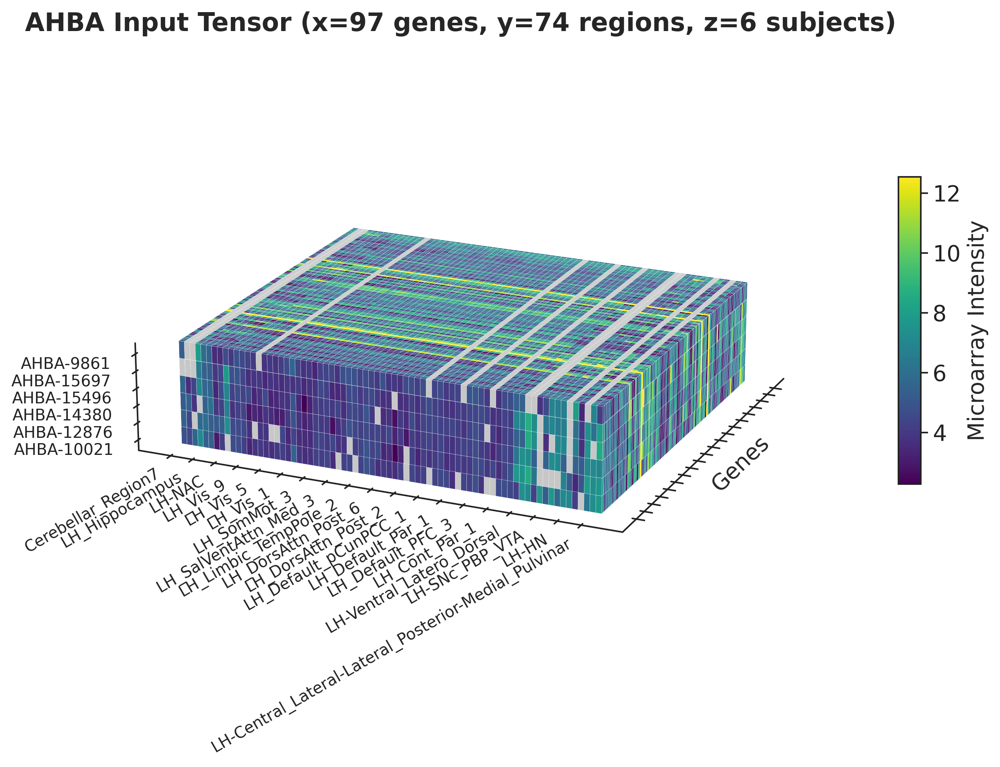

In [5]:
T2_N_SUBJECTS       = 6
T2_N_REGIONS        = 74
T2_REGION_TICK_STEP = 4

ahba_t2 = build_native_tensor_view(
    CSV_PATH, dataset='AHBA', region_ordering='region_matched_superset',
    n_regions=T2_N_REGIONS, n_subjects=T2_N_SUBJECTS, gene_panel=GENE_LIST, n_genes=N_GENES,
    min_regions_per_subject=MIN_OBSERVED_PARCELS, random_seed=RANDOM_SEED,
    matching_policy=MATCHING_POLICY, matching_policy_hemi_mode=MATCHING_POLICY_HEMI_MODE,
    gtex_rep_mode=GTEX_REP_MODE, gtex_hemi_mode=GTEX_HEMI_MODE,
)
print('AHBA T2', ahba_t2.values.shape, 'axis=', ahba_t2.region_axis_kind)

fig, ax = plot_gtex_tensor_voxels(
    ahba_t2, **{**BASE,
        'subject_tick_step': 1,            # all 6 subject labels
        'region_tick_step': T2_REGION_TICK_STEP,
        'show_subject_ticklabels': True,
        'show_region_ticklabels': True,
    },
)
plt.show()

## Tensor 3 — joint ComBat-harmonized (GTEx + AHBA)

Both datasets harmonized on the shared superset frame, stacked along the subject axis
(`plot_joint_tensor_voxels`, `normalization='shared'`). Region ticks every 2 (no labels) +
region y-axis title; subject labels every 2; gene defaults.

harmonized joint (81, 74, 97) matched_region_count= 12


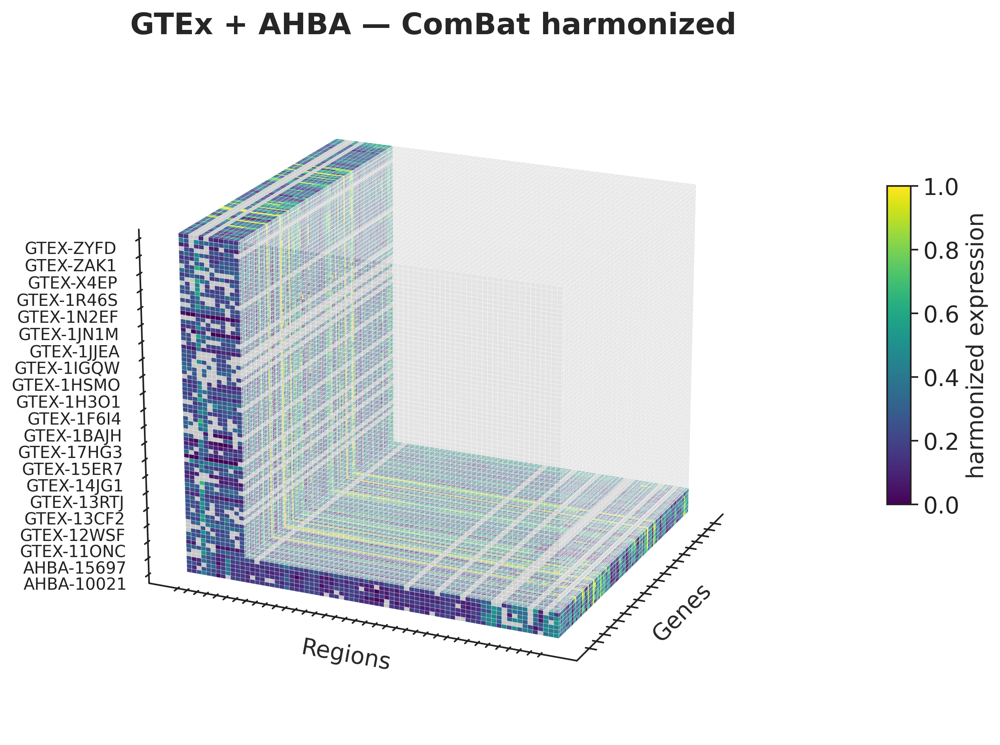

In [6]:
T3_N_GTEX           = 75
T3_N_AHBA           = 6
T3_N_REGIONS        = 74
T3_REGION_TICK_STEP = 2
T3_SUBJECT_TICK_STEP = 4
STACK_ORDER = ('AHBA', 'GTEx')   # AHBA lower z so GTEx renders on top

_cmb = dict(cfg=cfg, matching_context=ctx, region_ordering='region_matched_superset',
            gene_panel=GENE_LIST, n_regions=T3_N_REGIONS, n_genes=N_GENES, random_seed=RANDOM_SEED)
gtex_h = build_combat_tensor_view(prepost, dataset='GTEx', stage='harmonized', n_subjects=T3_N_GTEX, **_cmb)
ahba_h = build_combat_tensor_view(prepost, dataset='AHBA', stage='harmonized', n_subjects=T3_N_AHBA, **_cmb)
harmonized_joint = build_joint_tensor_view(gtex_h, ahba_h, stack_order=STACK_ORDER)
print('harmonized joint', harmonized_joint.values.shape, 'matched_region_count=', harmonized_joint.matched_region_count)

fig, ax = plot_joint_tensor_voxels(
    harmonized_joint, **{**BASE,
        'normalization': 'shared',
        'cbar_label': 'harmonized expression',
        'subject_tick_step': T3_SUBJECT_TICK_STEP,
        'region_tick_step': T3_REGION_TICK_STEP,
        'show_subject_ticklabels': True,
        'show_region_ticklabels': False,   # ticks every 2, no region labels
        'show_y_axis_label': True,         # region y-axis title
        'dataset_gap': 1,
    },
)
ax.set_title('GTEx + AHBA — ComBat harmonized', fontsize=18, pad=2.0)
plt.show()

## Tensor 4 — joint GTEx `loro_fused` (predictions + extrapolations)

The fully completed tensor: GTEx `loro_fused` (LORO held-out predictions + full-fit
extrapolation) stacked against the AHBA harmonized reference. Same config as Tensor 3.
Subjects are pre-filtered before stacking so only `T4_N_GTEX` npz files load.

fused joint (81, 74, 97) future_imp_cols= 74


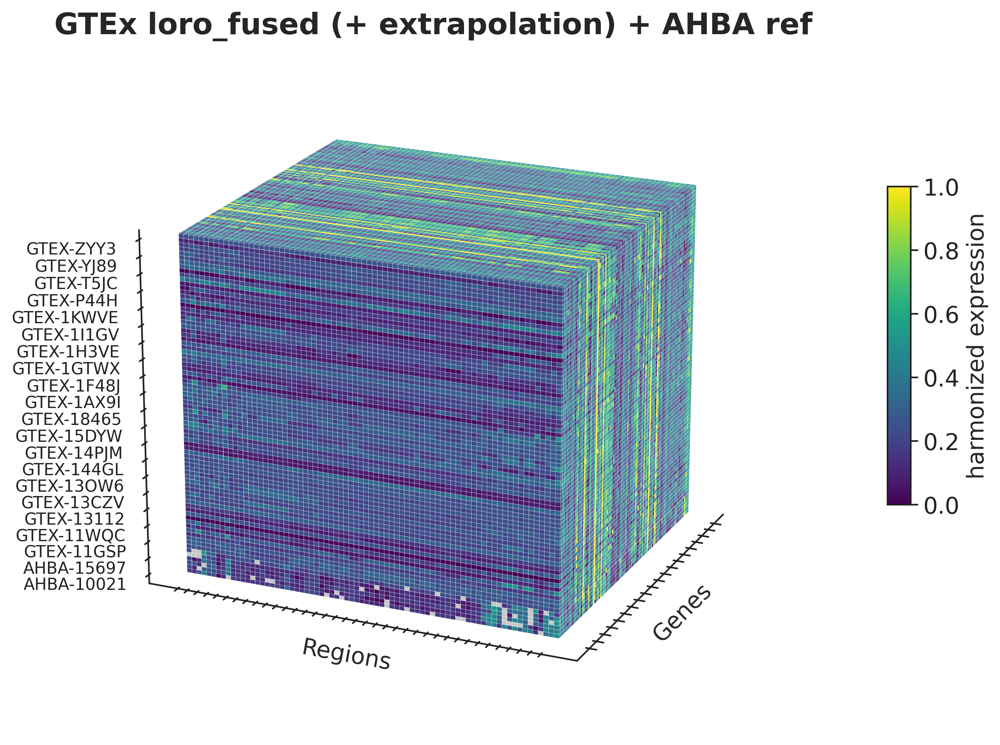

In [7]:
T4_N_GTEX    = 75
T4_N_AHBA    = 6
T4_N_REGIONS = 74

# Pre-filter the subject list (avoid stacking the full ~300 npz cube).
_random.seed(RANDOM_SEED)
_all_subj = sorted(p.stem for p in (Path(CACHE_ROOT) / GENE_SCOPE / MODEL_NAME).glob('*.npz'))
SUBJECTS_TO_LOAD = sorted(_random.sample(_all_subj, min(T4_N_GTEX, len(_all_subj))))

_pred = dict(cfg=cfg, matching_context=ctx, region_ordering='region_matched_superset',
             gene_panel=GENE_LIST, n_regions=T4_N_REGIONS, n_genes=N_GENES, random_seed=RANDOM_SEED)
gtex_fused = build_prediction_tensor_view(
    CACHE_ROOT, MODEL_NAME, dataset='GTEx', stage='loro_fused',
    subjects=SUBJECTS_TO_LOAD, n_subjects=T4_N_GTEX, **_pred,
)
ahba_ref = build_combat_tensor_view(prepost, dataset='AHBA', stage='harmonized', n_subjects=T4_N_AHBA, **_pred)
fused_joint = build_joint_tensor_view(gtex_fused, ahba_ref, stack_order=STACK_ORDER)
print('fused joint', fused_joint.values.shape,
      'future_imp_cols=', int(gtex_fused.future_imputation_mask.any(axis=0).sum()))

fig, ax = plot_joint_tensor_voxels(
    fused_joint, **{**BASE,
        'normalization': 'shared',
        # T4 differs from T3: extrapolated + LORO cells fully OPAQUE (no transparency)
        'future_imputation_rgba': (0.78, 0.78, 0.78, 1.0),
        'cbar_label': 'harmonized expression',
        'subject_tick_step': T3_SUBJECT_TICK_STEP,
        'region_tick_step': T3_REGION_TICK_STEP,
        'show_subject_ticklabels': True,
        'show_region_ticklabels': False,
        'show_y_axis_label': True,
        'dataset_gap': 1,
    },
)
ax.set_title('GTEx loro_fused (+ extrapolation) + AHBA ref', fontsize=18, pad=2.0)
plt.show()

## On-brain — AHBA donors (1×6, left-sagittal)

The 6 AHBA donors rendered as `joint`-scope left-sagittal surfaces (section-4c styling:
sampled parcels clear, unsampled cortex faded shell, LH only). Gene = `genes[0]` (the tensor
face). Age/sex caption above each brain; one shared colorbar. viridis.

on-brain gene: ADAM23


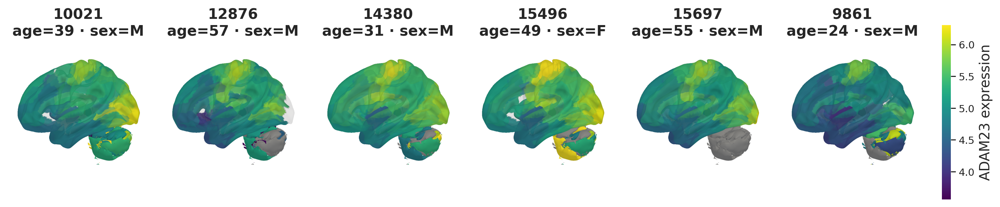

In [15]:
brain = ob.BrainSurfaceRenderer(atlas_cache='data/brain_atlas_4s')   # loads surface + atlas once

# On-brain views use the bare target-parcel axis so region labels match the atlas exactly.
_ob = dict(cfg=cfg, matching_context=ctx, region_ordering='target_parcel',
           gene_panel=GENE_LIST, n_regions=None, n_genes=N_GENES, random_seed=RANDOM_SEED)

ahba_ob = build_combat_tensor_view(prepost, dataset='AHBA', stage='harmonized', n_subjects=6, **_ob)
OB_GENE = ahba_ob.genes[0]
print('on-brain gene:', OB_GENE)

ahba_caps = {s: ob.format_demo_caption(prepost['ahba_raw'], s) for s in ahba_ob.subjects}
ob.render_subject_brain_grid(
    brain, ahba_ob, OB_GENE, ahba_ob.subjects,
    ncols=6, nrows=1, cmap='viridis', captions=ahba_caps, caption_fontscale=1.25,
    title=None, cbar_label=f'{OB_GENE} expression',
)

## On-brain — GTEx subjects (3×6, sampling diversity)

GTEx subjects rendered the same way, but on the **observed** (sparse) harmonized stage so each
subject's unsampled parcels fade to the shell — visualizing sampling-coverage diversity. Grid
shape adjustable via `GTEX_OB_NROWS`/`GTEX_OB_NCOLS`. Subjects = the first N on the Tensor-1
axis (overlap with the labeled tensor). Larger captions relative to the brains. Common colorbar.

18 GTEx subjects (from Tensor-1 axis)


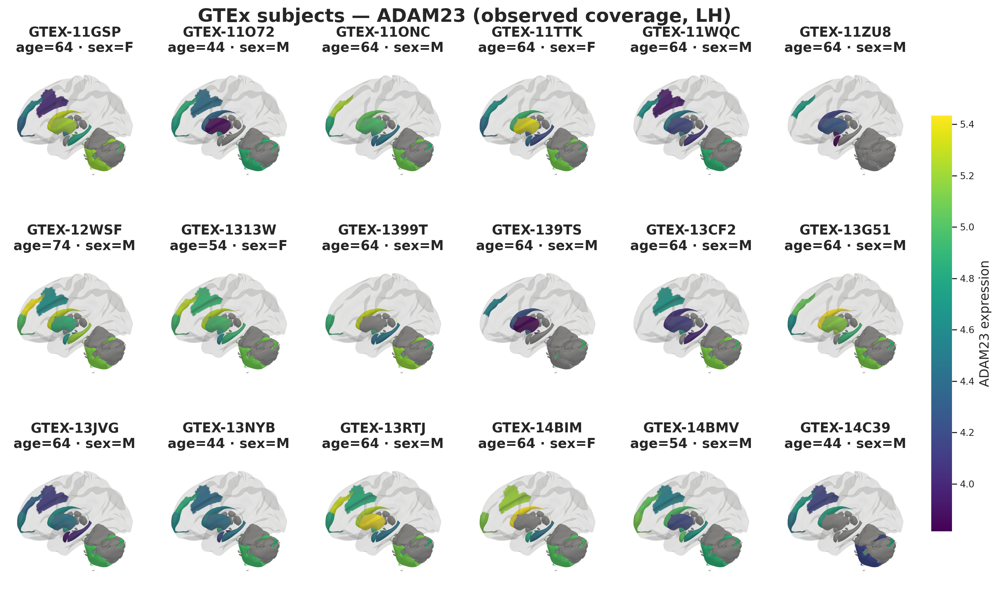

In [17]:
GTEX_OB_NROWS, GTEX_OB_NCOLS = 3, 6
GTEX_OB_CAPTION_SCALE        = 1.15   # smaller so labels don't collide brain-to-brain
GTEX_OB_WSPACE               = 0.15  # extra horizontal gap between brains

gtex_ob = build_combat_tensor_view(prepost, dataset='GTEx', stage='harmonized', n_subjects=None, **_ob)

# First N subjects as ordered on the Tensor-1 axis that are present in the on-brain view.
_present = set(gtex_ob.subjects)
ob_subjects = [s for s in gtex_t1.subjects if s in _present][:GTEX_OB_NROWS * GTEX_OB_NCOLS]
print(f'{len(ob_subjects)} GTEx subjects (from Tensor-1 axis)')

gtex_caps = {s: ob.format_demo_caption(prepost['gtex_raw'], s) for s in ob_subjects}
ob.render_subject_brain_grid(
    brain, gtex_ob, OB_GENE, ob_subjects,
    ncols=GTEX_OB_NCOLS, nrows=GTEX_OB_NROWS, cmap='viridis', captions=gtex_caps,
    caption_fontscale=GTEX_OB_CAPTION_SCALE, wspace=GTEX_OB_WSPACE,
    title=f'GTEx subjects — {OB_GENE} (observed coverage, LH)', cbar_label=f'{OB_GENE} expression',
)